In [1]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import e3nn
from e3nn import o3, io
import numpy as np
import torch 
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import open3d as o3d
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io

# plotly.io.renderers.default = "notebook"

from tqdm.notebook import tqdm
from functools import partial, reduce


from utils import load_model, save_model, CustomLRScheduler

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = 'cpu' # for now batch=1 so no need for gpu
device


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


'cpu'

In [2]:
from data_generation import SimpleShapeDataset, SimpleShapeUniformRayDataset

dataset = SimpleShapeUniformRayDataset(sample_points=20000)

data = next(iter(DataLoader(dataset, batch_size=1))).float()

In [9]:
# how does it look like in spherical harmonics?

sphten = io.SphericalTensor(11, 1, 1)
signal = o3.spherical_harmonics(sphten, x=data, normalize=False).mean(dim=[0, 1])

fig = make_subplots(rows=1, cols=2, specs=[[{'is_3d': True} for j in range(2)] for i in range(1)])
# fig.add_trace(go.Scatter3d(x=0.12 * data[0, :, 0], y=0.12 * data[0, :, 1], z=0.12 * data[0, :, 2]), row=1, col=2)
fig.add_trace(go.Surface(sphten.plotly_surface(signal, radius=True)[0]), row=1, col=2)
fig.add_trace(go.Scatter3d(x=data[0, :, 0], y=data[0, :, 1], z=data[0, :, 2]), row=1, col=1)

In [4]:
class SelfTP(nn.Module):
    def __init__(self, irreps_in, irreps_out, batch_norm=True):
        super(SelfTP, self).__init__()
        
        self.tp = o3.FullyConnectedTensorProduct(irreps_in1=irreps_in, irreps_in2=irreps_in, irreps_out=irreps_out)
        self.bn = e3nn.nn.BatchNorm(irreps_out)
        self.batch_norm = batch_norm
        
    def forward(self, x):
        x = self.tp(x, x)
        if self.batch_norm:
            x = self.bn(x)
        return x      


class EncoderDecoder(nn.Module):
    def __init__(self, lmax=8, max_channel=64):
        super(EncoderDecoder, self).__init__()
       
        self.irrep_layer = []
        tw = 1
        for l in range(lmax, 0, -1): # last one sould be lmax=1
            irreps = io.SphericalTensor(lmax=l, p_arg=1, p_val=1)
            irreps = irreps * tw
            irreps = (irreps.sort())[0]
            irreps = irreps.simplify()
            self.irrep_layer.append(irreps)
            tw *= 2
            tw = min(tw, max_channel) # todo tune the max channel later

        self.model_sphten_repr = io.SphericalTensor(lmax=lmax, p_arg=1, p_val=1)
        self.latent_repr = self.irrep_layer[-1]
        
        # todo should the last layer have batch norm?
        # todo use fully connected tensor product?
        self.encoder = nn.Sequential(*[
            SelfTP(irreps_in=self.irrep_layer[i], irreps_out=self.irrep_layer[i+1], batch_norm=(i != len(self.irrep_layer)-2))
            for i in range(len(self.irrep_layer)-1)
        ])

        # todo is the information bottleneck limited enough?
        self.decoder = nn.Sequential(*[
            SelfTP(irreps_in=self.irrep_layer[i+1], irreps_out=self.irrep_layer[i], batch_norm=(i != 0))
            for i in range(len(self.irrep_layer)-2, -1, -1)            
        ])

    # def forward(self, points):
    #     inp = o3.spherical_harmonics(l=self.model_sphten_repr, x=points, normalize=False).mean(dim=1) # todo fix the normalization later
    #     latent = self.encoder(inp)
    #     out = self.decoder(latent)
    #     return inp, latent, out

    def forward(self, inp):
        # inp = o3.spherical_harmonics(l=self.model_sphten_repr, x=points, normalize=False).mean(dim=1) # todo fix the normalization later
        latent = self.encoder(inp)
        out = self.decoder(latent)
        return inp, latent, out

In [5]:
model = EncoderDecoder().to(device)

print("number of parameters = ", sum([np.prod(x.shape) for x in model.parameters()]))

dataset = SimpleShapeUniformRayDataset(sample_points=20000)

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs

number of parameters =  9239206


In [6]:
shs = []

for i in range(len(dataset)):
    points = torch.from_numpy(dataset[i])
    sh = o3.spherical_harmonics(l=model.model_sphten_repr, x=points, normalize=False).mean(dim=0)
    shs.append(sh)

In [7]:
def train(
        model,
        dataset,
        loss_fn,        
        epochs=600,
        checkpoint_interval=50,
        initial_rl=1,
        scheduler=None,
        optimizer=None
):
    
    if optimizer is None:
        optimizer = torch.optim.Adam(model.parameters(), lr=initial_rl)

    dataloader = DataLoader(dataset, batch_size=len(dataset))

    pbar = tqdm(range(epochs))
    losses = []
    for epoch in pbar:
        for data in dataloader:
            data = data.float().to(device)            
            inp, latent, out = model(data)    
            loss = loss_fn(inp, out)
            optimizer.zero_grad()
            loss.backward()
            max_grad = max([torch.linalg.norm(p.grad).item() for p in model.parameters() if p.grad is not None])
            optimizer.step()
            pbar.set_description(f'Epoch {i+1} Loss: {loss.item():.8f} Lr={optimizer.param_groups[0]["lr"]} MaxGrad={max_grad:.4f}')
            losses.append(loss.item())
            
        if epoch % checkpoint_interval == 0:
            name = f'epoch_{epoch}'
            save_model(model, name)
            print(f'saved {name}')

        if scheduler is not None:   
            scheduler.step()
    return losses

In [10]:
save_model(model, 'initial_state')
# load_model(model, 'sample')

In [12]:
initial_rl = 1
optimizer = torch.optim.Adam(model.parameters(), lr=initial_rl)
custom_scheduler = CustomLRScheduler(optimizer, initial_rl)
# scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[100, 200, 300, 400, 500], gamma=1.1) # todo interesting apparently you shouldn't change rl
loss_fn = torch.nn.MSELoss(reduction='sum')

  0%|          | 0/100 [00:00<?, ?it/s]

saved epoch_0
saved epoch_50


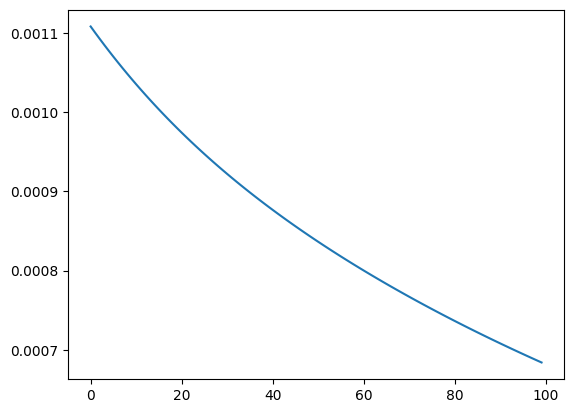

In [18]:
losses = train(model=model, dataset=shs, loss_fn=loss_fn, epochs=100, initial_rl=None, scheduler=custom_scheduler, optimizer=optimizer)
save_model(model, 'final_state')

plt.plot(losses)

  0%|          | 0/100 [00:00<?, ?it/s]

saved epoch_0
saved epoch_50


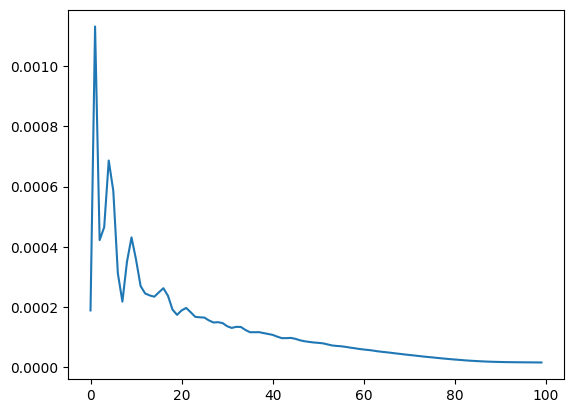

In [49]:
load_model(model, 'initial_state')

initial_rl = 0.01
optimizer = torch.optim.Adam(model.parameters(), lr=initial_rl)
custom_scheduler = CustomLRScheduler(optimizer, initial_rl)

losses = train(model=model, dataset=shs, loss_fn=loss_fn, epochs=100, initial_rl=None, scheduler=custom_scheduler, optimizer=optimizer)
save_model(model, 'final_state')

plt.plot(losses)

In [54]:
load_model(model, 'final_state')
save_model(model, 'almost_perfect_state')

  0%|          | 0/100 [00:00<?, ?it/s]

saved epoch_0
saved epoch_50


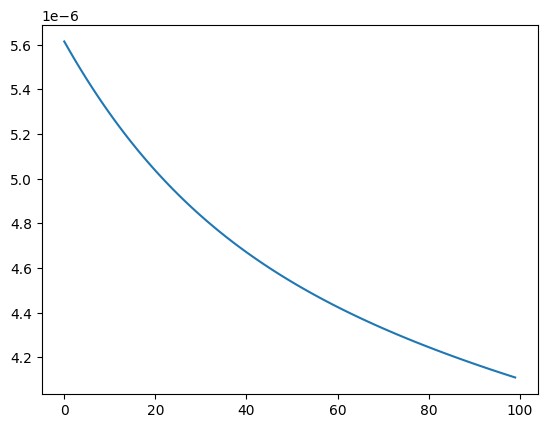

In [60]:
# optimizer = torch.optim.Adam(model.parameters(), lr=initial_rl)
# custom_scheduler = CustomLRScheduler(optimizer, initial_rl)

custom_scheduler.set_rl(0.01)
losses = train(model=model, dataset=shs, loss_fn=loss_fn, epochs=100, initial_rl=None, scheduler=custom_scheduler, optimizer=optimizer)
save_model(model, 'final_state')

plt.plot(losses)

In [13]:
load_model(model, 'almost_perfect_state')

dataloader = DataLoader(shs, batch_size=len(shs)) # todo note that this is shs 

single_data = next(iter(dataloader)).float().to(device)

inp, latent, out = model(single_data)
inp = inp.cpu().detach()
latent = latent.cpu().detach()
out = out.cpu().detach()

print('loss', loss_fn(inp, out))
print('L-inf loss', torch.max(torch.abs(inp - out)))

sphten = model.model_sphten_repr
fig = make_subplots(rows=1, cols=2, specs=[[{'is_3d': True} for j in range(2)] for i in range(1)])
fig.add_trace(go.Surface(sphten.plotly_surface(out, radius=True)[0]), row=1, col=1)
fig.add_trace(go.Surface(sphten.plotly_surface(inp, radius=True)[0]), row=1, col=2)

loss tensor(0.0010)
L-inf loss tensor(0.0190)


In [12]:
inp

tensor([[ 2.8209e-01,  5.7394e-04, -1.6671e-04, -1.0985e-03, -1.6407e-03,
          1.4262e-04, -4.3509e-04, -1.8032e-04,  8.2716e-05, -2.4169e-04,
         -7.1313e-04,  1.1147e-03,  4.5872e-04, -7.6699e-04,  1.4792e-04,
          4.3502e-04,  5.0669e-04,  3.4176e-04, -4.4641e-04, -4.9658e-04,
         -1.4642e-02, -6.0980e-04, -3.2799e-04, -7.8372e-04, -1.2318e-02,
         -8.1594e-06, -2.6257e-05,  1.6438e-04, -1.6962e-04, -1.4834e-04,
          4.7857e-05,  3.6351e-04, -1.3287e-05,  6.6180e-04, -8.4666e-05,
          1.5249e-04, -1.6435e-04, -6.3978e-06, -6.1076e-05,  4.8849e-05,
          1.8391e-04,  1.8297e-04,  2.0283e-03,  3.9844e-05,  7.0317e-05,
          1.1802e-04, -4.6826e-03, -3.7894e-05,  5.9121e-05,  1.8659e-04,
          1.5787e-04, -2.3787e-04,  7.0731e-05, -5.5229e-05,  2.1489e-04,
          1.0619e-04, -1.2519e-04, -3.1850e-05, -5.2991e-05,  1.7199e-06,
          2.4676e-05,  1.0057e-04, -1.0818e-05, -2.8522e-05, -2.9957e-05,
          1.3093e-04,  7.7144e-05, -8.

In [13]:
out

tensor([[ 2.8202e-01, -9.7906e-04,  5.6848e-04,  1.0072e-03,  3.3816e-04,
         -2.4845e-04, -1.6967e-04,  2.8807e-04,  5.5621e-04,  2.0364e-04,
         -3.3331e-05, -5.0644e-04,  2.8786e-04, -8.6941e-05, -7.9957e-05,
         -3.3666e-04,  1.5593e-03,  3.5409e-04,  1.3825e-03, -1.2328e-03,
         -1.0013e-02,  5.9427e-03, -1.0220e-03,  4.1850e-03,  1.4033e-02,
          7.3187e-04, -9.7897e-05, -7.9322e-04, -3.2546e-04, -7.4509e-04,
         -4.9079e-04,  1.5202e-04,  3.4643e-04,  2.9073e-04,  8.7765e-04,
         -5.2844e-04, -2.3204e-04,  1.6224e-04, -2.1649e-04,  6.5228e-04,
          8.7366e-05,  6.5602e-05,  2.9935e-04, -9.5540e-04,  6.5511e-04,
          1.5318e-03,  2.3425e-03, -1.8547e-03,  1.2758e-04,  9.2836e-04,
          1.2395e-04, -9.2647e-04, -7.3971e-04,  1.0852e-03,  3.9393e-04,
         -6.1614e-04,  2.7697e-04, -1.0023e-04,  1.1243e-04,  5.3076e-05,
         -5.9406e-04,  7.3972e-04, -8.6308e-05,  6.1660e-04,  8.4676e-04,
         -9.5687e-05,  3.4265e-04,  2.

In [14]:
latent

tensor([[-267076.3438, -373402.1250,  336318.8125,  307949.6562, -384765.6250,
          377969.0000, -400024.7188, -214256.9531, -354154.5938, -181817.7344,
         -269989.7812, -216817.1406, -302646.3750,  330834.2500, -263113.5938,
         -233084.7656,  401360.9375,  395278.1562, -242570.7031, -397111.5625,
          364559.8750, -385918.2188,  396604.0312, -369235.7188, -304005.9375,
          384460.1875, -369282.4375, -240443.5469,  316186.1250,  275885.2812,
          240561.3438, -194582.0000, -278026.0625, -200407.7812, -390343.6250,
         -371290.1875,  398257.8438,  280166.6875,  312498.5938,  194075.7812,
          262562.4688, -378273.3750,  265135.9062, -381325.8438,  -91396.0859,
          324928.2188,  314822.6875,  332979.7500,  375089.6250,  180560.0938,
          374978.4375,  238250.4844, -243298.1250, -388494.0000, -314446.0000,
          280239.2812,  219525.6250,  338880.9688, -355739.6250, -281482.6562,
          218308.1250,  195030.5156,  270798.4688,  

### Test Rotation

In [15]:
pc1 = dataset[0]

In [20]:
# todo later try with a different object

pc2 = np.einsum('ij,nj->ni', o3.rand_matrix(), dataset[0])

In [21]:
fig = make_subplots(rows=1, cols=2, specs=[[{'is_3d': True} for j in range(2)] for i in range(1)])
fig.add_trace(go.Scatter3d(x=pc1[:, 0], y=pc1[:, 1], z=pc1[:, 2]), row=1, col=1)
fig.add_trace(go.Scatter3d(x=pc2[:, 0], y=pc2[:, 1], z=pc2[:, 2]), row=1, col=2)

In [22]:
load_model(model, 'almost_perfect_state')
model.eval()

EncoderDecoder(
  (encoder): Sequential(
    (0): SelfTP(
      (tp): FullyConnectedTensorProduct(1x0e+1x1e+1x2e+1x3e+1x4e+1x5e+1x6e+1x7e+1x8e x 1x0e+1x1e+1x2e+1x3e+1x4e+1x5e+1x6e+1x7e+1x8e -> 2x0e+2x1e+2x2e+2x3e+2x4e+2x5e+2x6e+2x7e | 648 paths | 648 weights)
      (bn): BatchNorm (2x0e+2x1e+2x2e+2x3e+2x4e+2x5e+2x6e+2x7e, eps=1e-05, momentum=0.1)
    )
    (1): SelfTP(
      (tp): FullyConnectedTensorProduct(2x0e+2x1e+2x2e+2x3e+2x4e+2x5e+2x6e+2x7e x 2x0e+2x1e+2x2e+2x3e+2x4e+2x5e+2x6e+2x7e -> 4x0e+4x1e+4x2e+4x3e+4x4e+4x5e+4x6e | 3584 paths | 3584 weights)
      (bn): BatchNorm (4x0e+4x1e+4x2e+4x3e+4x4e+4x5e+4x6e, eps=1e-05, momentum=0.1)
    )
    (2): SelfTP(
      (tp): FullyConnectedTensorProduct(4x0e+4x1e+4x2e+4x3e+4x4e+4x5e+4x6e x 4x0e+4x1e+4x2e+4x3e+4x4e+4x5e+4x6e -> 8x0e+8x1e+8x2e+8x3e+8x4e+8x5e | 18816 paths | 18816 weights)
      (bn): BatchNorm (8x0e+8x1e+8x2e+8x3e+8x4e+8x5e, eps=1e-05, momentum=0.1)
    )
    (3): SelfTP(
      (tp): FullyConnectedTensorProduct(8x0e+8x1e+8x2e

In [23]:
sh1 = o3.spherical_harmonics(l=model.model_sphten_repr, x=torch.from_numpy(pc1).float().unsqueeze(0), normalize=False).mean(dim=1)
sh2 = o3.spherical_harmonics(l=model.model_sphten_repr, x=torch.from_numpy(pc2).float().unsqueeze(0), normalize=False).mean(dim=1)

with torch.no_grad():
    inp1, latent1, out1 = model(sh1)
    inp2, latent2, out2 = model(sh2)

def interpolate_in_latent_space(repr, latent1, latent2, s):
    res = torch.empty_like(latent1)
    assert(latent1.shape == latent2.shape)
    
    ind = 0
    for l in repr.ls:
        sz = 2 * l + 1
        vec1 = latent1[..., ind:ind+sz]
        vec2 = latent2[..., ind:ind+sz]
        
        if sz == 1:
            # todo we do linear interpolation because the signs might be different... why do we not have to care about this in other irreps?
            vec_interp = vec1 + (vec2 - vec1) * s
            res[..., ind:ind+sz] = vec_interp
        elif sz == 3:
            norm1 = torch.linalg.norm(vec1, dim=-1, keepdim=True)
            norm2 = torch.linalg.norm(vec2, dim=-1, keepdim=True)
            vec1_norm = vec1 / norm1
            vec2_norm = vec2 / norm2
            axis = torch.cross(vec1_norm, vec2_norm, dim=-1)
            axis_norm = torch.norm(axis, dim=-1)
            axis /= axis_norm
            theta = torch.asin(axis_norm)
            R = o3.axis_angle_to_matrix(axis=axis, angle=theta * s)
            
            vec_interp_size = vec1 * torch.pow(norm2 / norm1, s)
            vec_interp_rotated = torch.einsum('nij,nj->ni', R, vec_interp_size)
            vec_interp = vec_interp_rotated
            res[..., ind:ind+sz] = vec_interp
        else:
            raise Exception("l > 1 is not supported in interpolation sorry :))")

        ind += sz
    assert(ind == res.shape[-1])
    return res


# interpolate_in_latent_space(repr=o3.Irreps('1e') + o3.Irrep('0e'), latent1=torch.tensor([10, 0, 0, 0]).float().unsqueeze(0), latent2=torch.tensor([1, -1, 0, 10]).float().unsqueeze(0), s=1)
# torch.max(torch.abs(interpolate_in_latent_space(repr=model.latent_repr, latent1=latent1, latent2=latent2, s=1) - latent2))

In [25]:
N = 3
cnt = 0
rows = 1
columns = 4

fig = make_subplots(rows=rows, cols=columns, specs=[[{'is_3d': True} for j in range(columns)] for i in range(rows)])

for i in range(rows):
    for j in range(columns):
        if cnt >= N:
            continue
        latent_interp = interpolate_in_latent_space(repr=model.latent_repr, latent1=latent1, latent2=latent2, s=cnt/N)
        with torch.no_grad():
            out_interp = model.decoder(latent_interp).detach().cpu()
        sphten = model.model_sphten_repr
        fig.add_trace(go.Surface(sphten.plotly_surface(out_interp, radius=True)[0]), row=i+1, col=j+1)
        cnt += 1

fig.add_trace(go.Surface(sphten.plotly_surface(out_interp, radius=True)[0]), row=1, col=4)

tensor([[-5.9605e-08, -6.4028e-10, -1.3097e-10,  1.6298e-09,  0.0000e+00,
          2.0373e-10,  4.9477e-10,  2.9104e-11,  1.2806e-09, -5.8208e-11,
         -5.8208e-11, -2.3283e-10, -1.0768e-09,  5.8208e-11,  1.0186e-10,
          2.9104e-11, -5.8208e-11,  5.8208e-11,  1.1642e-10,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -2.9104e-11,  5.8208e-11,  9.3132e-10,
         -7.6398e-11, -1.4552e-11, -1.4552e-11,  4.3656e-11,  2.9104e-11,
          2.6921e-10, -2.9104e-11,  2.5466e-11, -1.1642e-10,  0.0000e+00,
          1.4552e-11,  4.3656e-11,  3.0468e-11,  3.6380e-11, -6.1846e-11,
         -1.4552e-11, -7.2760e-11, -6.9849e-10,  6.1846e-11, -1.6007e-10,
          2.9104e-11,  0.0000e+00,  2.9104e-11, -2.9104e-11,  0.0000e+00,
         -1.4552e-11,  2.9104e-11,  7.2760e-12,  1.8190e-11,  1.4552e-11,
          6.5484e-11,  1.6007e-10, -1.0914e-11,  1.4552e-11,  2.7853e-11,
         -1.0914e-11,  2.9104e-11,  6.3665e-12,  2.5466e-11,  0.0000e+00,
         -4.3656e-11,  1.4552e-11,  4.